## Initial Setup

In [1]:
from PIL import Image, ImageFilter

In [2]:
# Define image tiling function
def tile(*images, vertical=False):
    width, height = images[0].width, images[0].height
    tiled_size = (
        (width, height * len(images))
        if vertical
        else (width * len(images), height)
    )
    tiled_img = Image.new(images[0].mode, tiled_size)
    row, col = 0, 0
    for image in images:
        tiled_img.paste(image, (row, col))
        if vertical:
            col += height
        else:
            row += width

    return tiled_img

## Bands and Modes of an Image

In [3]:
# In an RGB image, each pixel is represented by three values corresponding to the red, green, and blue values for that pixel.
# The Image object for an RBG image contains three bands, one for each color. 
# An RGB image of size 100x100 pixels is represented by a 100x100x3 array of values.
# The mode of an image describes what type of image you’re working with, e.g. RGB, grayscale, RGBA, CMYK

filename = "c:/pillow/images/strawberry.jpg"
with Image.open(filename) as img:
    img.load()

In [4]:
img.getbands()

('R', 'G', 'B')

In [5]:
# Separate an image into its bands using .split() and combine separate bands back into an Image object using merge(). 
# When using .split(), the method returns all the bands as separate Image objects.
# The mode of the object that .split() returns is 'L', indicating this is a grayscale image, 
# i.e. an image that only displays the luminance values of each pixel.

red, green, blue = img.split()
red.mode

'L'

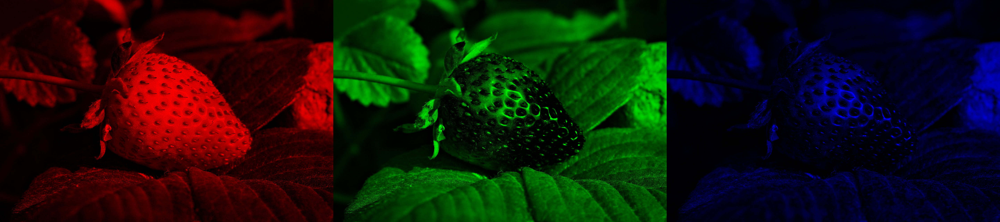

In [6]:
# create three new red, green, and blue channel images using Image.merge()
no_band = red.point(lambda _: 0)

red_merge = Image.merge(
    "RGB", (red, no_band, no_band)
    )

green_merge = Image.merge(
    "RGB", (no_band, green, no_band)
    )

blue_merge = Image.merge(
    "RGB", (no_band, no_band, blue)
    )

red_green_blue = tile(red_merge, green_merge, blue_merge)
red_green_blue

## Image Segmentation and Superimposition

In [7]:
filename_cat = "c:\pillow\images\cat.jpg"

with Image.open(filename_cat) as img_cat:
    img_cat.load()

img_cat = img_cat.crop((800, 0, 1650, 1281))

### Image Thresholding

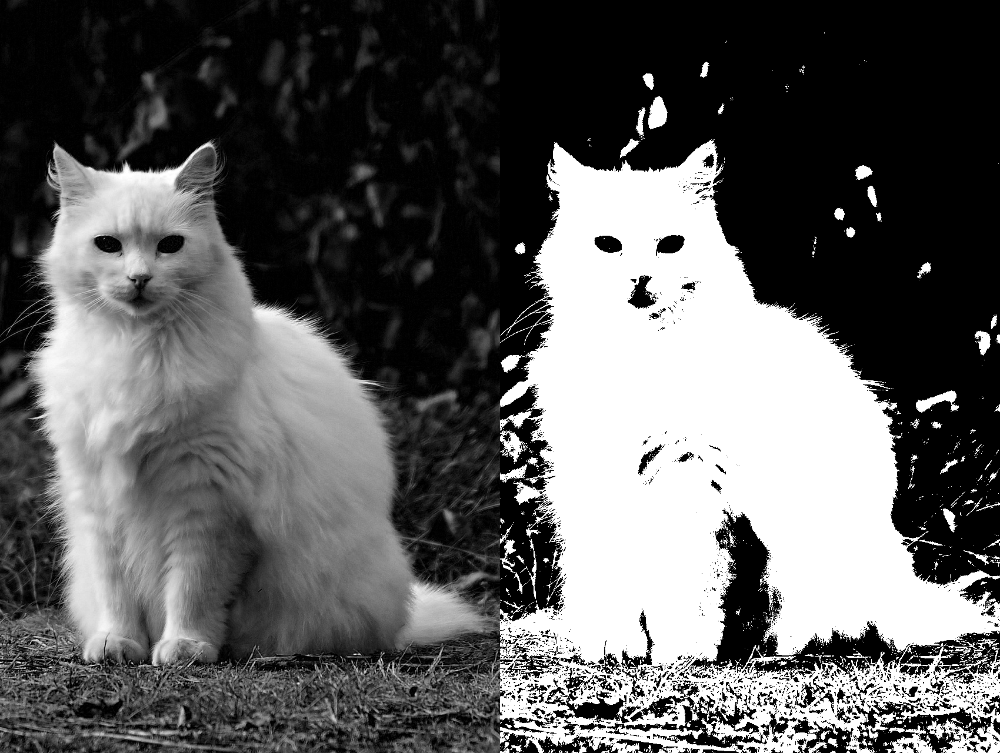

In [8]:
# Thresholding can be used to segment images when the object to segment is distinct from the background. 
# Achieve better results with versions of the original image that have higher contrast. 
# In this example, achieve higher contrast by thresholding the blue channel of the original image rather than the 
# grayscale image, because the dominant colors in the background are brown and green colors, which have a weak blue component.

red, green, blue = img_cat.split()

threshold = 58
img_cat_threshold_blue = blue.point(lambda x: 255 if x > threshold else 0)
img_cat_threshold_blue = img_cat_threshold_blue.convert("1")

split_cat = tile(blue, img_cat_threshold_blue)
split_cat

### Erosion & Dilation

In [9]:
# Define functions to perform cycles of erosion and dilation
# Erosion is the process of removing white pixels from the boundaries in an image
# Dilation is the opposite process to erosion. White pixels are added to the boundaries in a binary image

def erode(cycles, image):
    for _ in range(cycles):
            image = image.filter(ImageFilter.MinFilter(3))
    return image

def dilate(cycles, image):
    for _ in range(cycles):
        image = image.filter(ImageFilter.MaxFilter(3))
    return image

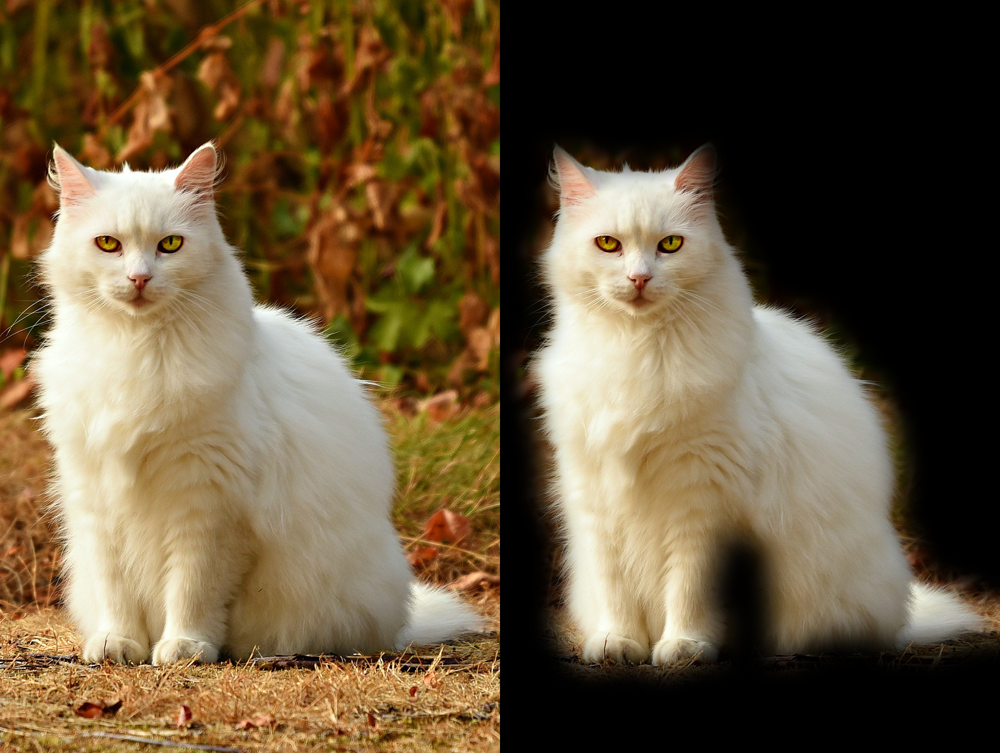

In [10]:
step_1 = erode(12, img_cat_threshold_blue)
step_2 = dilate(44, step_1)
step_3 = erode(35, step_2)
step_4 = dilate(24, step_3)
step_5 = erode(15, step_4)

convert = step_5.convert("L")
cat_mask = convert.filter(ImageFilter.GaussianBlur(20))
blank = img_cat.point(lambda _: 0)
cat_background_removed = Image.composite(img_cat, blank, cat_mask)
cats = tile(img_cat, cat_background_removed)
cats

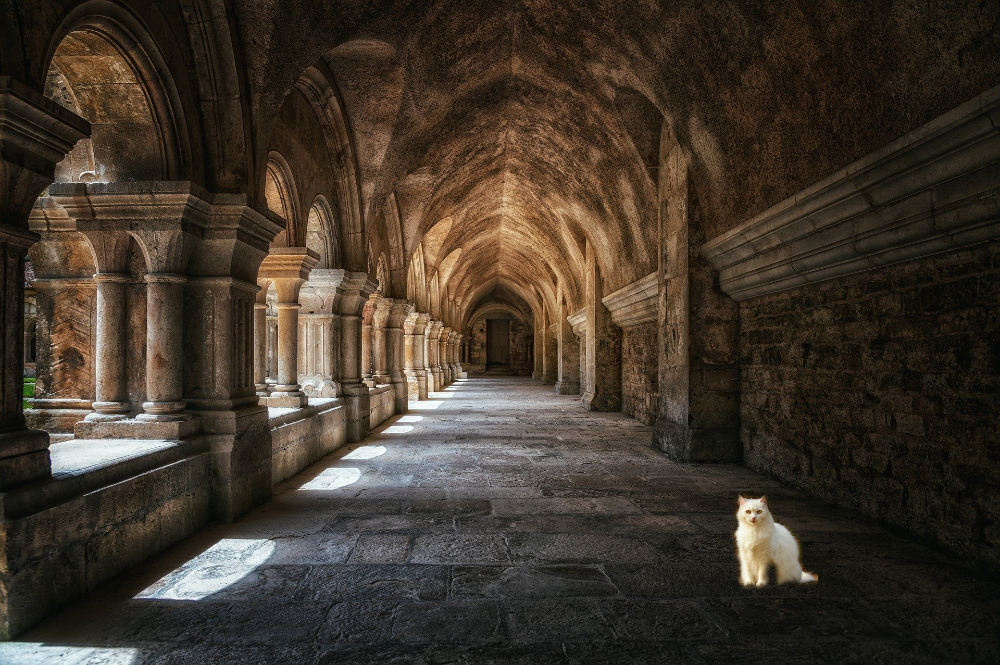

In [11]:
filename_monastery = "c:/pillow/images/monastery.jpg"

with Image.open(filename_monastery) as img_monastery:
    img_monastery.load()

# Coordinates determine where cat image is pasted into monastery image    
img_monastery.paste(
    img_cat.reduce(5), (1400, 900),
     cat_mask.reduce(5),
     )

img_monastery